In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2
import warnings
warnings.filterwarnings('ignore')

!export PYTHONPATH=/run/data

from IPython.core.pylabtools import figsize

import matplotlib.pyplot as plt

# Registration

In [2]:
import ndreg
from ndreg import preprocessor, util, plotter
from itkwidgets import view
import SimpleITK as sitk

In [3]:
# load images
img = util.imgRead('./atenolol1_100um.img')
atlas = util.imgRead('./ara_100um.img')
# run registration
atlas_registered = ndreg.register_brain(atlas, img)

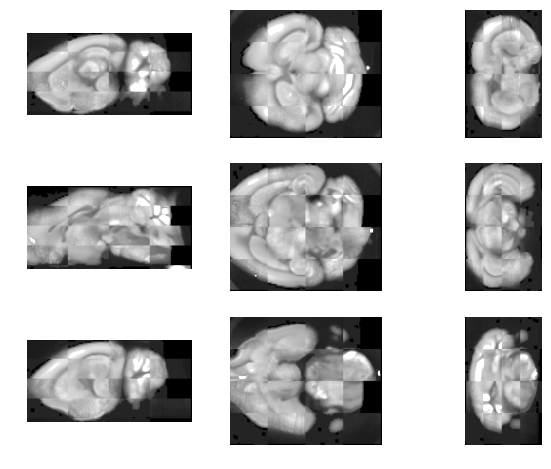

In [4]:
figsize(10, 8)
plotter.imgShow(plotter.imgChecker(atlas_registered, img), vmax=2)

# Cell detection

### Run _bloby_ on downsampled laVision whole volume

In [5]:
from ndmulticore import parallel

boss_resource_config = 'neurodata.cfg'
module_name = 'bloby.BlobDetector'
function_name = 'multicore_handler'
output_file = 'bloby_demo_predictions.csv'

parallel.start_process(module_name, function_name, output_file, boss_resource_config)
print('Centroids saved to {}'.format(output_file))

HBox(children=(IntProgress(value=0, description=u'Bloby processing...'), HTML(value=u'')))

Centroids saved to bloby_demo_predictions.csv


### Visualize results

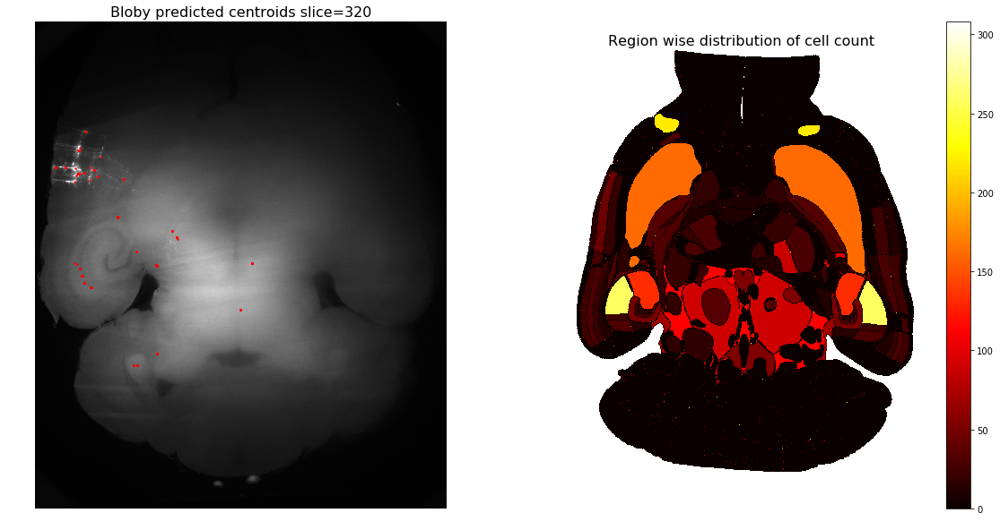

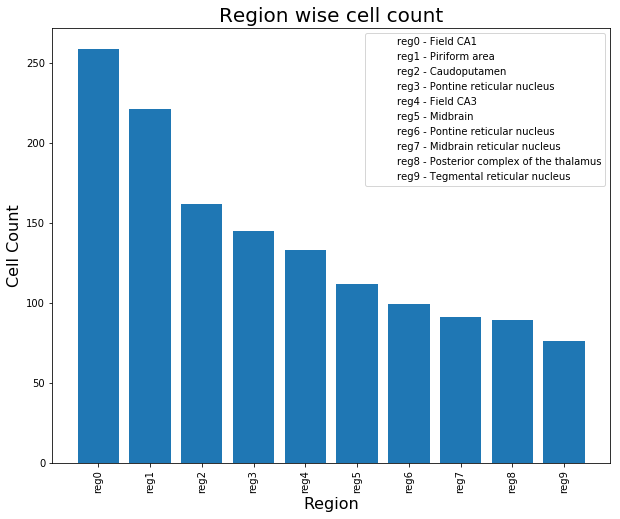

In [6]:
from bloby_scripts import visualize_centroids, visualize_region, visualize_region_count_bar

fig = plt.figure(figsize=(20, 10))
visualize_centroids(output_file, fig)
visualize_region('atenolol_new_predictions_native.csv', 'atenolol_reg_atlas.tiff', fig)
plt.show()

visualize_region_count_bar()

# Tractography

### Load data and run the tractography pipeline

In [7]:
from cobalt_tractography.bossHandler import *
from cobalt_tractography.tractography import *

# Parameters:
coll_name = 'ailey-dev'
exp_name = 'DRN-BLA_2378'
chan_name = 'Ch0'
x_rng = [9250, 9750]
y_rng = [18000, 18500]
z_rng = [500, 600]

# Using bossHandler class to download from Boss:
bHandler = bossHandler(coll_name)
bHandler.select_experiment(exp_name)
exp = bHandler.get_experiment()
bHandler.select_channel(chan_name)
data_cutout_raw = bHandler.get_cutout(x_rng, y_rng, z_rng)
data_cutout_raw = np.transpose(img_as_uint(data_cutout_raw),(1,2,0))

th = tractoHandler(data_cutout_raw)
skeleton, concomp, concomp_col, data_cutout_binarized =th.run_tractography(1)

slice-by-slice with subsampling


### Visualize (animated)

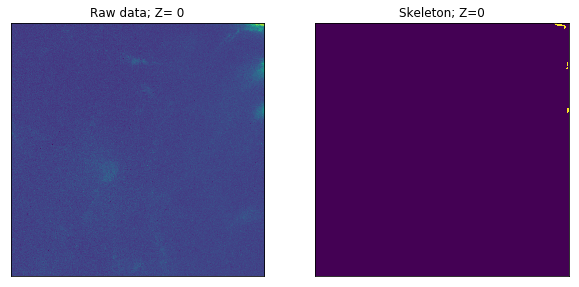

In [8]:
from skimage.morphology import binary_dilation

animi = videoviz(data_cutout_raw , 255*np.uint8(binary_dilation(skeleton, np.ones((3,3,3)))))    
HTML(animi.to_jshtml())

## Quantify tractography results
For each machine labeled voxel find the closest manually labeled and calculate the physical distance

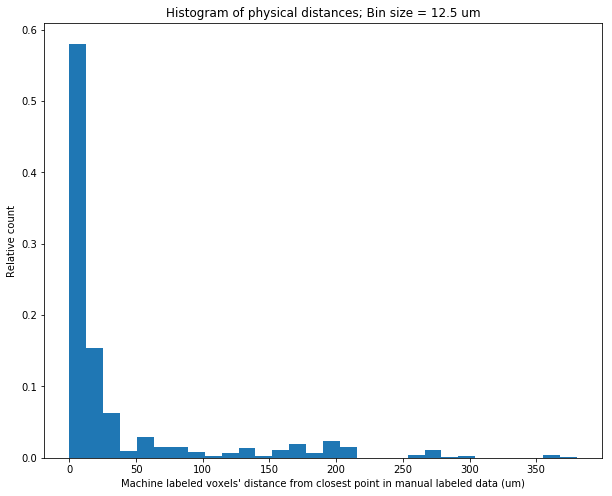

In [9]:
plot_quantification('/run/data/tractography_4.swc', skeleton,0.585, 0.585, 5.0)

# Simulation and Metrics

In [10]:
from cobalt_tractography.bossHandler import *
from cobalt_tractography.tractography import *
from cobalt_tractography import tractogen
from cobalt_tractography import tractometrics

import tifffile as tiff
import numpy as np

from skimage import img_as_uint

## Generating points and plotting on tif


In [11]:
# Generating points and plotting on tif
sim_file_name = 'demo.tif'
# [z, y, x]
pts1 = tractogen.gen_points([47, 350, 240], num_segs=75, seg_len=20)
pts2 = tractogen.gen_points([47, 350, 240], num_segs=50, seg_len=20)
pts3 = tractogen.gen_points([47, 350, 240], num_segs=50, seg_len=20)
curves = [pts1, pts2, pts3]
arr = tractogen.plot_curves_on_tif(curves, sim_file_name, shape=[100, 500, 500], return_array=True)

# Reading in simulated data
data_cutout_raw = tiff.imread(sim_file_name)
data_cutout_raw = np.transpose(img_as_uint(data_cutout_raw),(1,2,0))
print(data_cutout_raw.shape)

# Running Tractography Algorithm
th = tractoHandler(data_cutout_raw)
skeleton, concomp, concomp_col, data_cutout_binarized =th.run_tractography(1)

(500, 500, 100)
slice-by-slice with subsampling


## Visualize (animated)
Visualize as an animation iterating through z slices

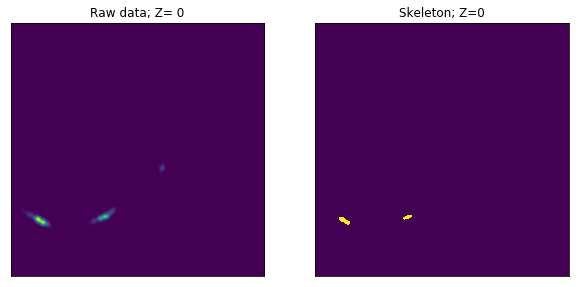

In [12]:
# Visualize the output (animation)

anim = videoviz(data_cutout_raw , data_cutout_binarized)    
HTML(anim.to_jshtml())


## Save results as swc


In [13]:
swcFileName = 'demo_prediction.swc'

unique_vals = np.unique(concomp)

clust_ids = np.empty((unique_vals.shape[0]-1))
outputmat = np.empty(((0,3)))
for i,cluster in enumerate(unique_vals[1:]):
        curr_clust = np.asarray(np.where( concomp == cluster )).T
        clust_ids[i] = curr_clust.shape[0]
        outputmat = np.append(outputmat , curr_clust, axis=0)


clust_ids = np.append([0] , np.cumsum(clust_ids)[:-1])

first_col = np.arange(1, outputmat.shape[0]+1).reshape(outputmat.shape[0],1)
second_col = 3*np.ones((outputmat.shape[0],1))
outputmat = np.append(second_col,outputmat, axis=1)
outputmat = np.append(first_col,outputmat, axis=1)

second_to_last_col = np.ones((outputmat.shape[0],1))
outputmat = np.append(outputmat, second_to_last_col, axis=1)
last_col = np.arange(outputmat.shape[0]).reshape(outputmat.shape[0],1)
last_col[np.uint16(clust_ids)] = -1
outputmat = np.append(outputmat, last_col ,axis=1)

np.savetxt(swcFileName , outputmat, fmt='%i')

## Metrics

PREDICTIONS


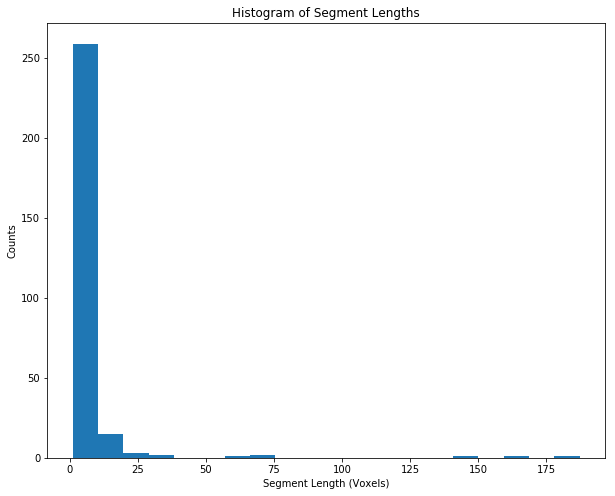

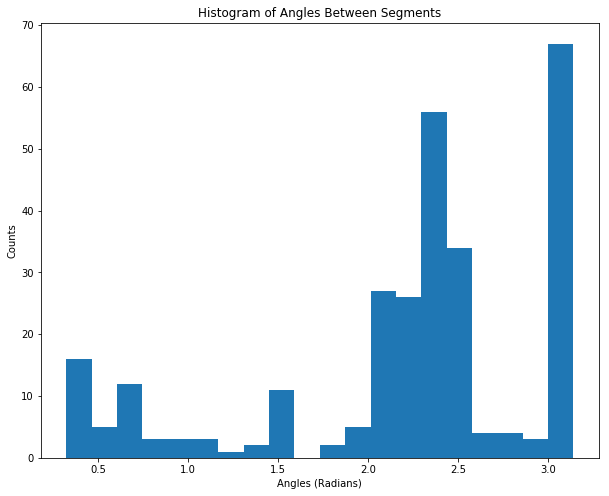

GROUND TRUTH


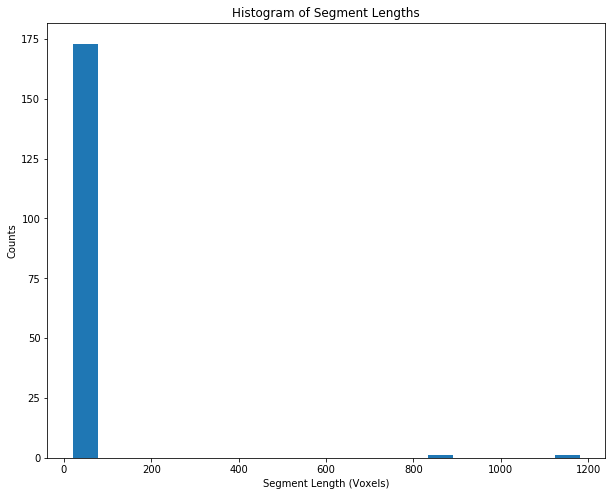

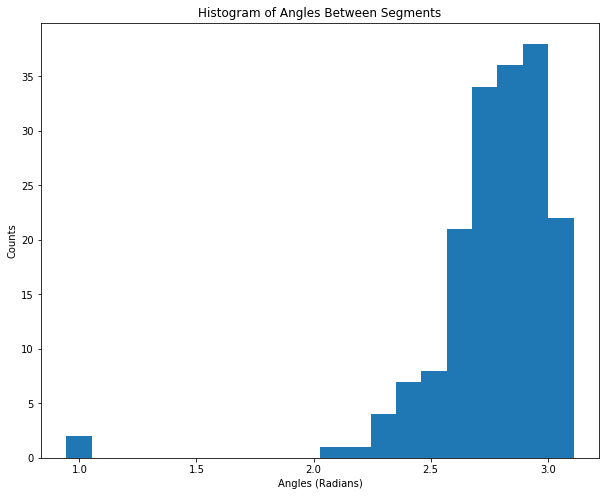

In [14]:
pred_curves = tractogen.swc_to_curves('demo_prediction.swc')
gt_curves = curves

print('PREDICTIONS')
pred_fv = tractometrics.compute_feature_vector(pred_curves, show_histogram=True)

print('GROUND TRUTH')
gt_fv = tractometrics.compute_feature_vector(gt_curves, show_histogram=True)